In [1]:
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf

from utils import *
from tensorflow.keras.layers import *

# Preparing the numeric Data

In [2]:
data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')

C:\Users\Bintang\AppData\Local\Temp\ipykernel_24408\3605832206.py:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')


In [3]:
data.columns

Index(['Temperature', 'Humidity', 'Illumination', 'kat_temperature',
       'kat_humidity', 'kat_illumination', 'Kipas', 'Humidifier', 'LED'],
      dtype='object')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8866 entries, 03/07/2023 0:00:00 to 10/07/2023 23:16:00
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Temperature       8866 non-null   float64
 1   Humidity          8866 non-null   int64  
 2   Illumination      8866 non-null   float64
 3   kat_temperature   8866 non-null   int64  
 4   kat_humidity      8866 non-null   int64  
 5   kat_illumination  8866 non-null   int64  
 6   Kipas             8866 non-null   int64  
 7   Humidifier        8866 non-null   int64  
 8   LED               8866 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 692.7+ KB


In [5]:
data = data[[col for col in data.columns if not col.startswith('kat_')]]

In [6]:
stats = data.describe()
stats.pop('Kipas')
stats.pop('LED') 
stats.pop('Humidifier')
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
Temperature,8866.0,29.948850,1.032873,27.6,28.90,30.20,30.80,32.80
Humidity,8866.0,66.783555,4.345455,54.0,64.00,67.00,70.00,76.00
Illumination,8866.0,73.429239,1.497201,69.6,72.82,73.24,73.65,80.59


In [7]:
train, test = train_test_split(data, test_size=.2, random_state=1)

In [8]:
train_label = format_output(train)
test_label = format_output(test)

In [9]:
x_train = norm_data(train, stats)
x_test = norm_data(test, stats)

x_train = x_train.to_numpy()
x_test = x_test.to_numpy()

In [10]:
type(x_train)

numpy.ndarray

In [11]:
print("Shape of x_train before reshaping:", x_train.shape)
print("Shape of x_test before reshaping:", x_test.shape)

# Reshape the data to be 3D for LSTM input
x_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))
x_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

# Check the shape after reshaping
print("Shape of x_train after reshaping:", x_train.shape)
print("Shape of x_test after reshaping:", x_test.shape)


Shape of x_train before reshaping: (7092, 3)
Shape of x_test before reshaping: (1774, 3)
Shape of x_train after reshaping: (7092, 1, 3)
Shape of x_test after reshaping: (1774, 1, 3)


# Preparing the Images Data

In [12]:
import os

In [13]:
img_path = os.path.join('dataset', 'imgs')
img_path

'dataset\\imgs'

In [14]:
classes = [x for x in os.listdir(img_path)]
classes

['hama', 'normal', 'penyakit']

In [15]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.,
    validation_split=.2,
)

In [16]:
train_data = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='training'
)

data_val = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='validation'
)

Found 240 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


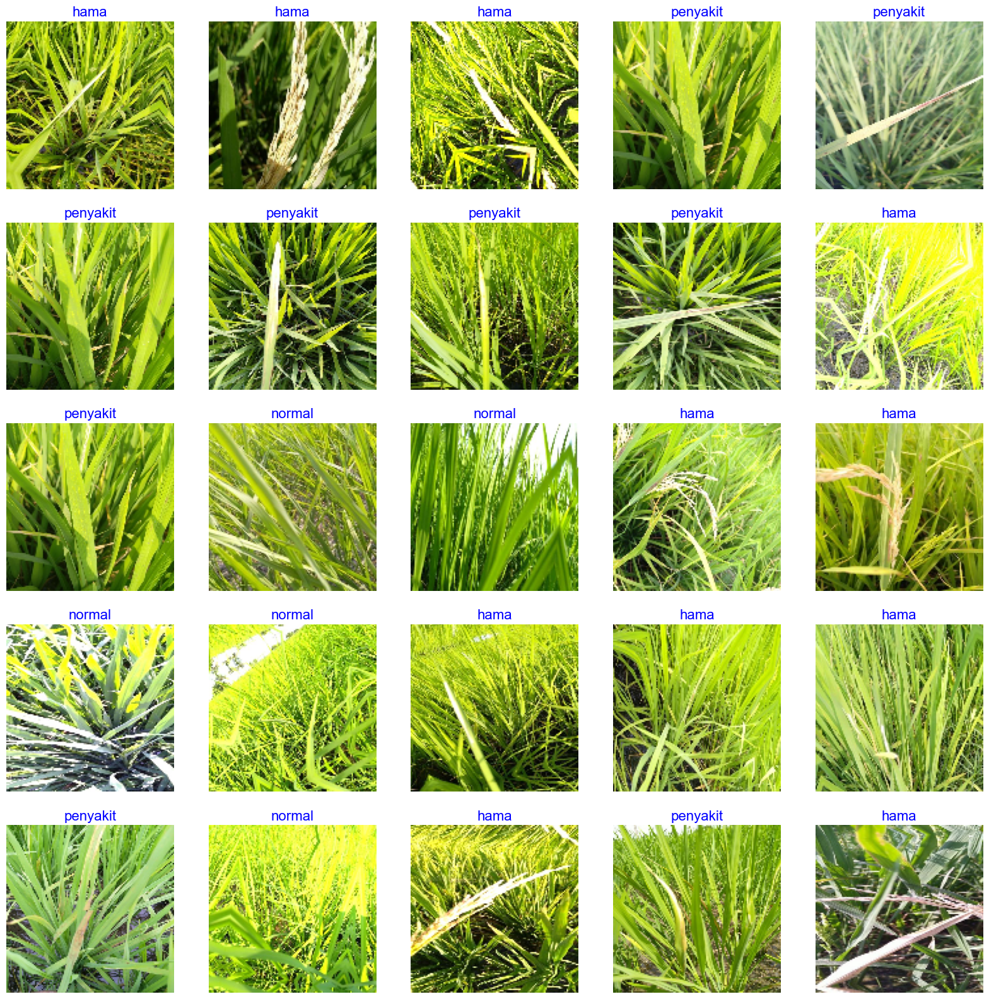

In [17]:
show_image_samples(train_data, classes)

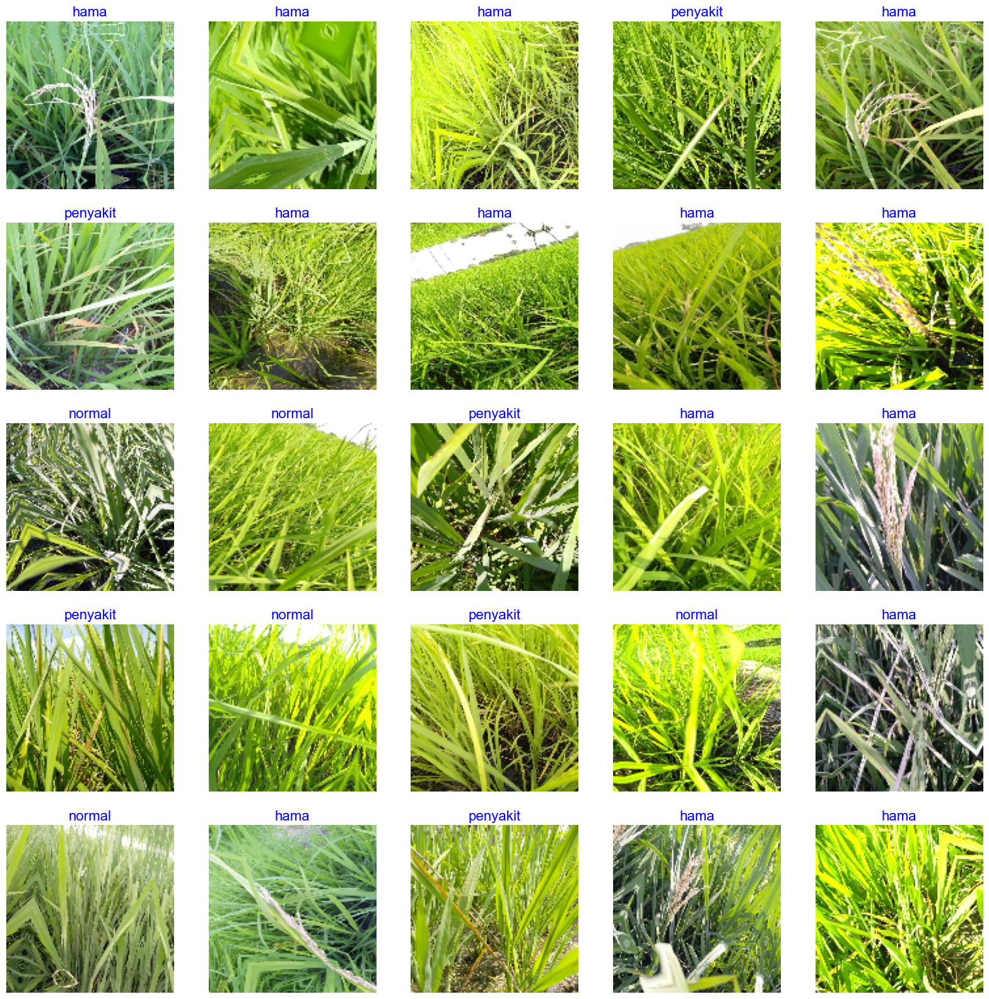

In [18]:
show_image_samples(data_val, classes)

# Create the models

In [19]:
def img_base_model(input_layer):
    base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=(128, 128, 3))
    for layer in base_model.layers:
        layer.trainable = False
    x = base_model(input_layer)
    return x

# Function to create the base model for time series data
def num_base_model(input_layer):
    x = Conv1D(32, 5, padding='causal', activation='relu')(input_layer)
    x = LSTM(64, return_sequences=True)(x)
    x = LSTM(64, return_sequences=True)(x)
    x = Flatten()(x)  # Flatten the output of LSTM to connect it with Dense layers
    x = Dense(512, activation='relu')(x)
    return x

# Function to create the fully connected layers
def flat_n_connected(input_layer, type_):
    if type_ == 'img':
        x = img_base_model(input_layer)
        x = Flatten()(x)
        x = Dense(512, activation='relu')(x)
    else:
        x = num_base_model(input_layer)
    return x

# Function to create the output model for numeric data
def output_model(input_layer):
    x = flat_n_connected(input_layer, 'num')
    fan_output = Dense(1, activation='sigmoid', name='fan_output')(x)
    led_output = Dense(1, activation='sigmoid', name='led_output')(x)
    humid_output = Dense(1, activation='sigmoid', name='humid_output')(x)
    return fan_output, led_output, humid_output

# Function to create the output model for image data
def img_output(input_layer):
    x = flat_n_connected(input_layer, 'img')
    output = Dense(len(classes), activation='softmax', name='img_output')(x)
    return output

In [20]:
num_input = tf.keras.layers.Input(shape=(x_train.shape[1], x_test.shape[2]), name='num_input')
img_input = Input(shape=(128, 128, 3), name='img_input')

In [21]:
fan_output, led_output, humid_output = output_model(num_input)
img_output_layer = img_output(img_input)

In [22]:
model = tf.keras.models.Model(inputs=[img_input, num_input], outputs=[img_output_layer, fan_output, led_output, humid_output])


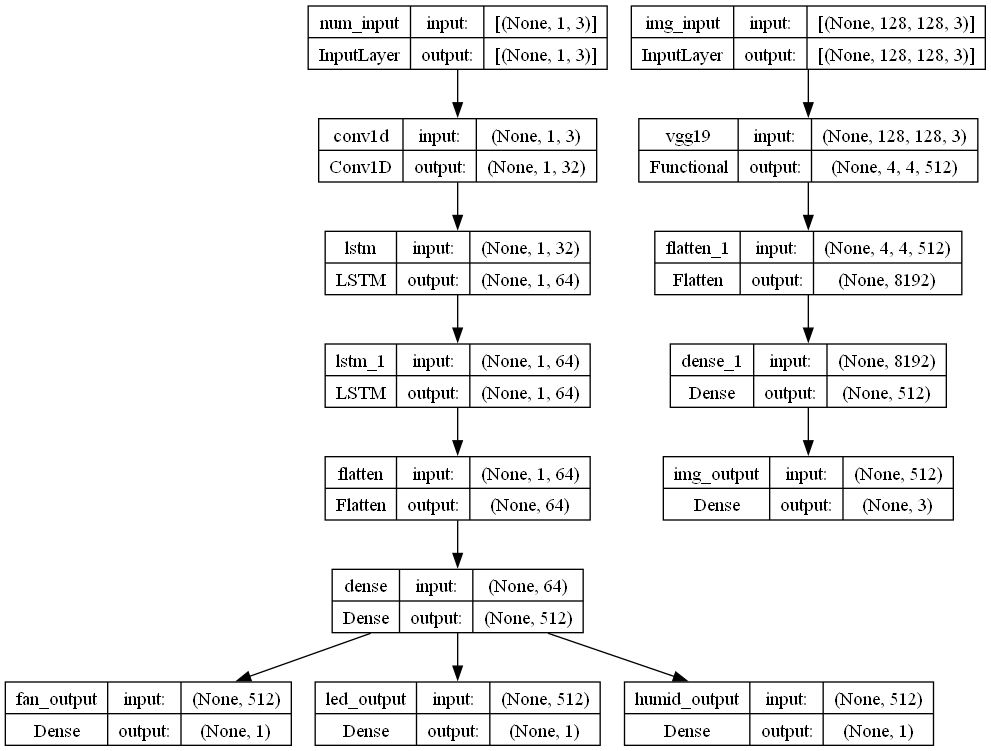

In [23]:
print_model(model, tf)